## Part 5.1 Run To get Confusion Matrix

In [ ]:
!python -m pip install pyyaml
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-h2jqrru3
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-h2jqrru3
     |████████████████████████████████| 50 kB 5.1 MB/s 
     |████████████████████████████████| 79 kB 7.0 MB/s 
     |████████████████████████████████| 151 kB 67.3 MB/s 
     |████████████████████████████████| 1.4 MB 91.5 MB/s 
     |████████████████████████████████| 548 kB 74.5 MB/s 
     |████████████████████████████████| 248 kB 88.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 96 kB 5.9 MB/s 
     |█████████████████████████

In [ ]:
from tensorboard.backend.event_processing import event_accumulator
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow
from google.colab import drive
import torch
import pandas as pd
drive.mount('/content/drive')

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.modeling import build_model
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.structures import BoxMode,pairwise_iou,Boxes


Mounted at /content/drive


In [ ]:
im_dir = '/content/drive/My Drive/Capstone Sample Data/sample/data' # path to the image directory in google drive

In [ ]:
# standard procedure to register data set

def get_dicts(img_dir):
    json_file = os.path.join(img_dir, "json_annotation.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns):
        record = {}
        
        filename = os.path.join(img_dir, v["file_name"])
        height = v["height"]
        width = v["width"]
        category_id = v["category_id"]
        mask = v["TrueMask"]
        bbox = v["bbox"]
        
        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width
      
        objs = []
        for i in range(len(category_id)):
            obj = {
                "bbox": bbox[i],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [mask[i]],
                "category_id": category_id[i],
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

for d in ["train", "val"]:
    DatasetCatalog.register("capstone_" + d, lambda d=d: get_dicts(im_dir + '/' + d))
    MetadataCatalog.get("capstone_" + d).set(thing_classes=["drivable surface","car","pedestrian","barrier","trafficcone","truck","motorcycle","construction worker"])
capstone_metadata = MetadataCatalog.get("capstone_train")

In [ ]:
# Setting up the model 

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("capstone_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join('/content/drive/My Drive/Capstone Sample Data/model_8classes_freeze1', "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.75]
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   
predictor = DefaultPredictor(cfg)

In [ ]:
# A customized function to get the confusion matrix base on prediction on every validation images

def conf_matrix_calc(labels, detections, n_classes, conf_thresh, iou_thresh):
   confusion_matrix = np.zeros([n_classes + 1, n_classes + 1])
   if len(detections) > 1:  
    
     l_classes = np.array(labels)[:, 0].tolist()[0]
     l_bboxs = (np.array(labels)[:, 1:]).tolist()[0]
     d_confs = np.array(detections)[:, 4]
     d_bboxs = (np.array(detections)[:, :4])
     d_classes = np.array(detections)[:, -1].astype(int)
     detections = detections[np.where(d_confs > conf_thresh)]
     labels_detected = np.zeros(len(labels[0][0]))
     detections_matched = np.zeros(len(detections))
     for l_idx, (l_class, l_bbox) in enumerate(zip(l_classes, l_bboxs)):
         l_class = int(l_class)
         for d_idx, (d_bbox, d_class) in enumerate(zip(d_bboxs, d_classes)):
            d_class = int(d_class)
            #print(l_bbox,d_bbox)
            iou = pairwise_iou(Boxes(torch.from_numpy(np.array([l_bbox]))), Boxes(torch.from_numpy(np.array([d_bbox]))))
            if iou >= iou_thresh:
                #print(l_class,d_class)
                confusion_matrix[l_class, d_class] += 1
                labels_detected[l_idx] = 1
                detections_matched[d_idx] = 1
    
     for i in np.where(labels_detected == 0)[0]:
        confusion_matrix[int(l_classes[i]), -1] += 1
     for i in np.where(detections_matched == 0)[0]:
        confusion_matrix[-1, int(d_classes[i])] += 1

   return confusion_matrix


In [ ]:
n_classes = 8
confusion_matrix = np.zeros([n_classes + 1, n_classes + 1])
with open('/content/drive/My Drive/Capstone Sample Data/sample/data/val/json_annotation.json', 'rb') as f:
     dataset_dicts_validation = json.load(f)
for d in dataset_dicts_validation:
     #print(d["file_name"])
     val_im = os.path.join('/content/drive/My Drive/Capstone Sample Data/sample/data/val/',d["file_name"])
     img = cv2.imread(val_im)
     outputs = predictor(img)
     labels = list()
     detections = list()
     for coord, conf, cls in zip(
         outputs["instances"].get("pred_boxes").tensor.cpu().numpy(),
         outputs["instances"].get("scores").cpu().numpy(),
         outputs["instances"].get("pred_classes").cpu().numpy(),
     ):
        
        detections.append(list(coord) + [conf] + [cls])
        
     labels.append([d["category_id"]] + d["bbox"])
     confusion_matrix += conf_matrix_calc(np.array(labels), np.array(detections), n_classes, conf_thresh=0.7, iou_thresh=0.75)
matrix_indexes = capstone_metadata.get("thing_classes") + ["null"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/lo

In [ ]:
# Save the consufion matrix in a csv file
df = pd.DataFrame(confusion_matrix, columns=matrix_indexes, index=matrix_indexes)
df.to_csv('/content/drive/My Drive/Capstone Sample Data/model_8classes_freeze1/confusionmatrix.csv')

In [ ]:
df.head()

,drivable surface,car,pedestrian,barrier,trafficcone,truck,motorcycle,construction worker,null
drivable surface,1344.0,1.0,0.0,0.0,5.0,0.0,0.0,0.0,587.0
car,0.0,930.0,0.0,0.0,0.0,2.0,0.0,0.0,605.0
pedestrian,0.0,0.0,579.0,0.0,0.0,0.0,0.0,0.0,925.0
barrier,0.0,0.0,0.0,310.0,3.0,0.0,0.0,0.0,598.0
trafficcone,0.0,0.0,0.0,0.0,302.0,0.0,0.0,0.0,412.0


---

*The section below is to test the output of the prediction model. (Please ignore this section)*

In [ ]:
val_img = os.path.join(im_dir,'val')
train_img = os.path.join(im_dir,'train')
val_metadata = MetadataCatalog.get("capstone_val")
train_metadata = MetadataCatalog.get("capstone_train")

In [ ]:
def get_label_img(im_dir, filename):
    dataset_dicts = get_dicts(im_dir)
    file_name = os.path.join(im_dir,filename)
    for d in dataset_dicts:
       if d['file_name'] == file_name:
         img = cv2.imread(file_name)
         visualizer = Visualizer(img[:, :, ::-1], metadata=capstone_metadata, scale=0.5)
         out = visualizer.draw_dataset_dict(d)
         cv2_imshow(out.get_image()[:, :, ::-1])  

In [ ]:
def get_predicted_img (im_dir, filename):
    file_name = os.path.join(im_dir,filename)
    im = cv2.imread(file_name)
    outputs = predictor(im)  

    v = Visualizer(im[:, :, ::-1],
              metadata=capstone_metadata, 
              scale=0.5, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

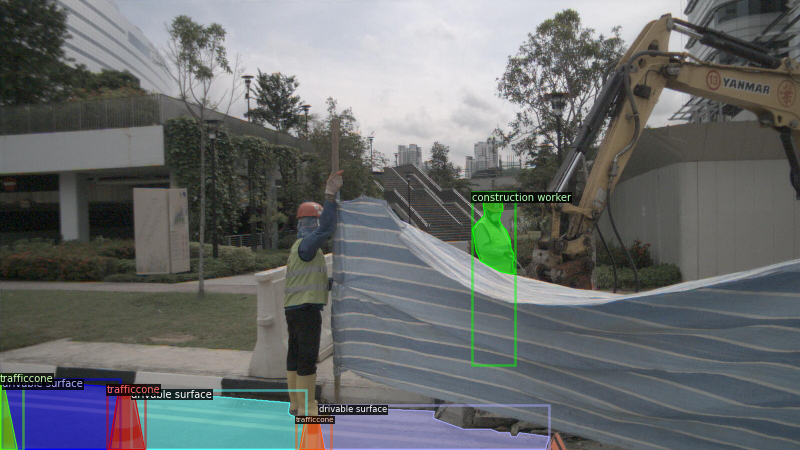

In [ ]:
get_label_img(val_img,'n010-2018-07-06-11-01-46+0800__CAM_BACK_LEFT__1530847108397633.jpg')

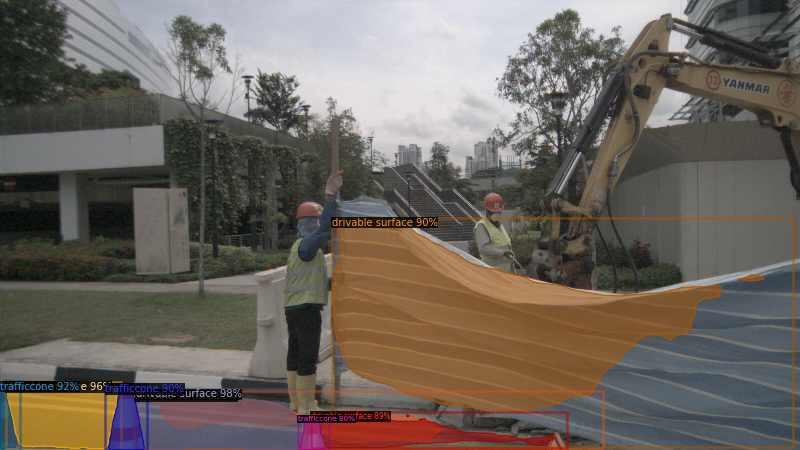

In [ ]:
get_predicted_img(val_img,'n010-2018-07-06-11-01-46+0800__CAM_BACK_LEFT__1530847108397633.jpg')

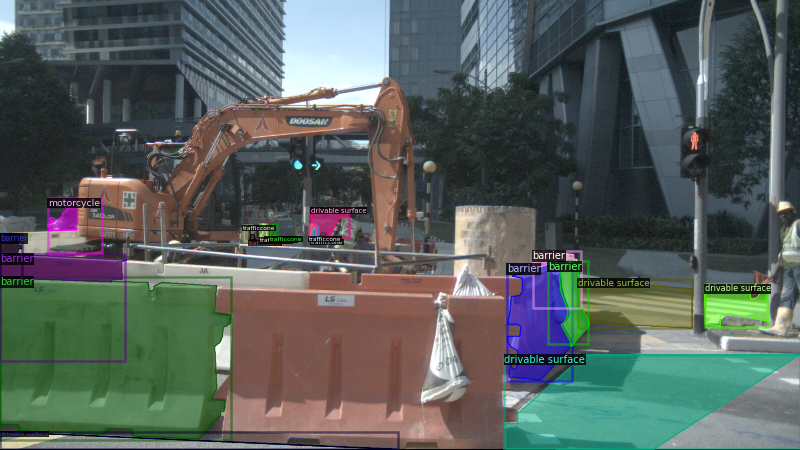

In [ ]:
get_label_img(val_img,'n003-2018-07-12-15-40-35+0800__CAM_FRONT_LEFT__1531381452505224.jpg')

[0.9811648  0.92033994 0.91099095 0.89488584 0.8610911  0.82018965
 0.7477573 ]


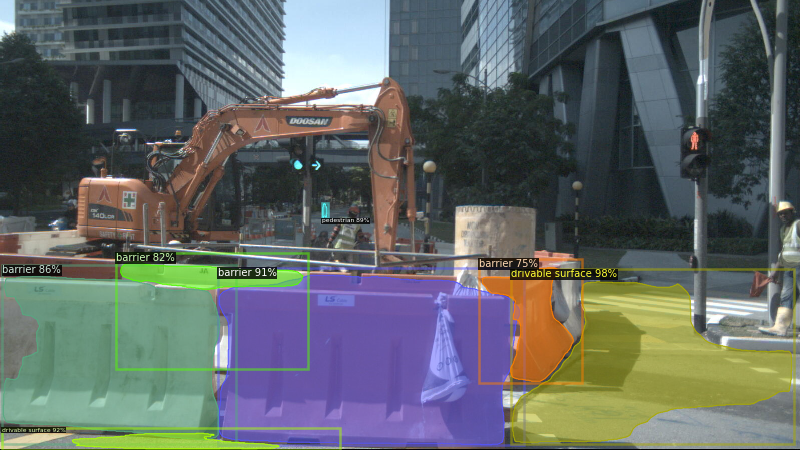

In [ ]:
get_predicted_img(val_img,'n003-2018-07-12-15-40-35+0800__CAM_FRONT_LEFT__1531381452505224.jpg')

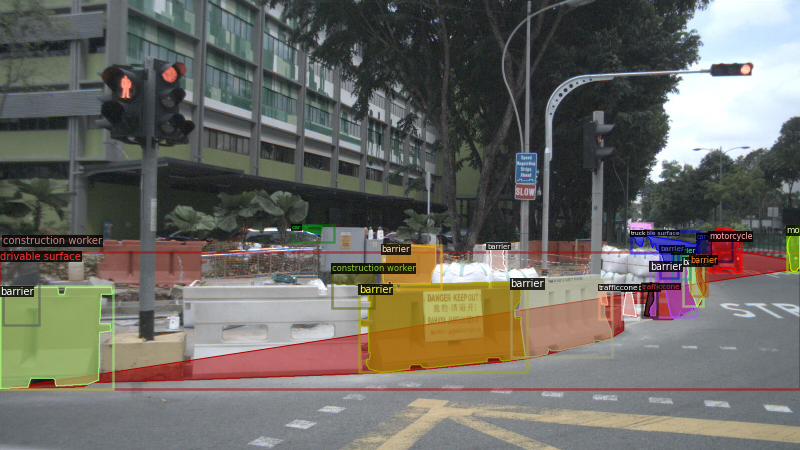

In [ ]:
get_label_img(val_img,'n010-2018-07-06-11-01-46+0800__CAM_BACK_LEFT__1530846410947633.jpg')

[0.9777924  0.9740864  0.9572678  0.9501929  0.94480735 0.93915915
 0.9075645  0.88378465 0.87667084 0.8473984  0.7511814 ]


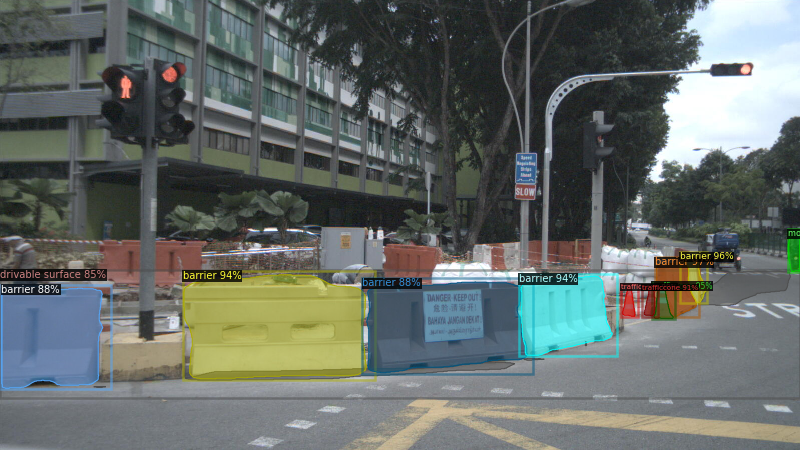

In [ ]:
get_predicted_img(val_img,'n010-2018-07-06-11-01-46+0800__CAM_BACK_LEFT__1530846410947633.jpg')

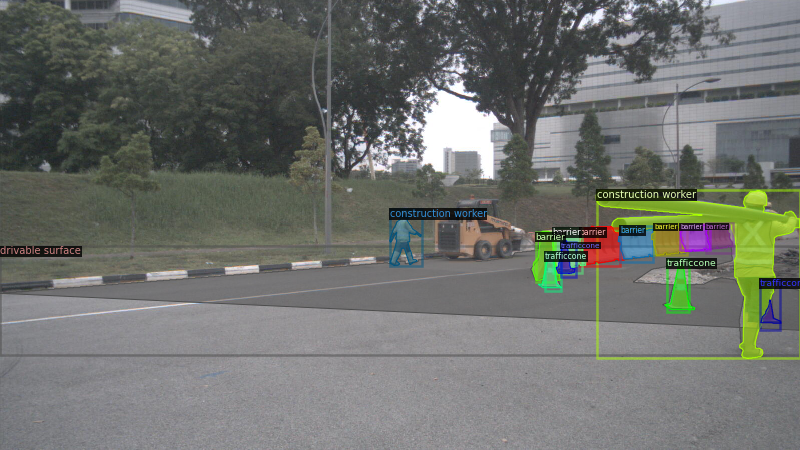

In [ ]:
get_label_img(val_img,'n013-2018-07-30-10-59-08+0800__CAM_BACK_LEFT__1532920079397155.jpg')

[0.98709226 0.9674751  0.9548566  0.93739045 0.9298784  0.9056558
 0.9030969  0.8831825  0.85744005 0.74663913 0.7187197  0.7059338 ]


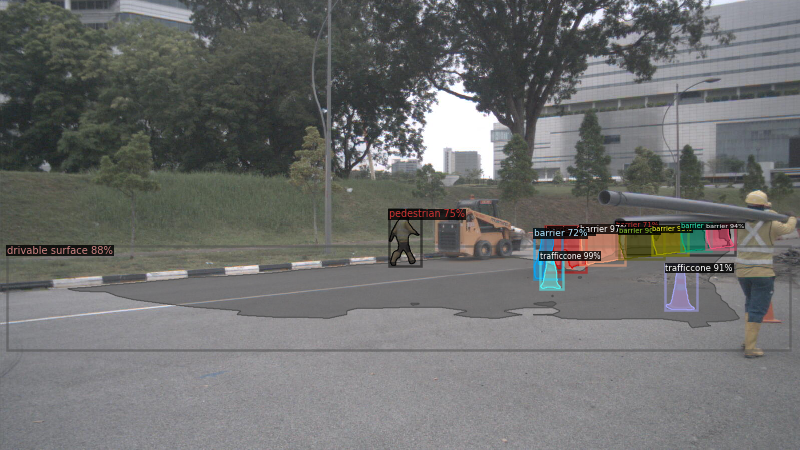

In [ ]:
get_predicted_img(val_img,'n013-2018-07-30-10-59-08+0800__CAM_BACK_LEFT__1532920079397155.jpg')

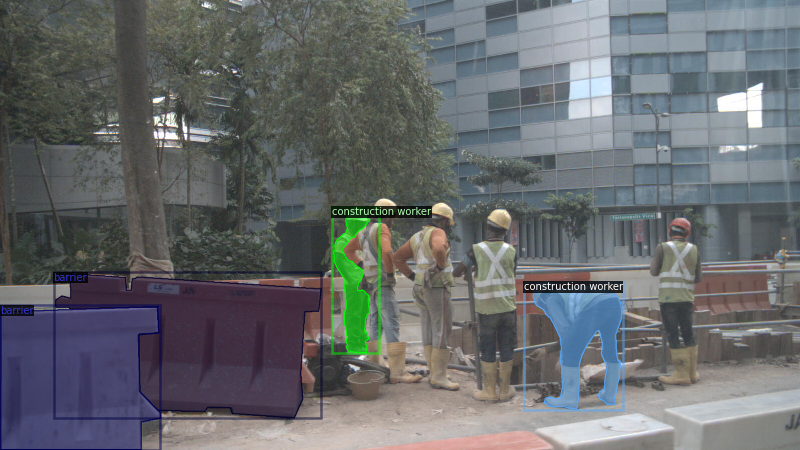

In [ ]:
get_label_img(val_img,'n013-2018-08-16-16-15-38+0800__CAM_BACK_RIGHT__1534407789878054.jpg')

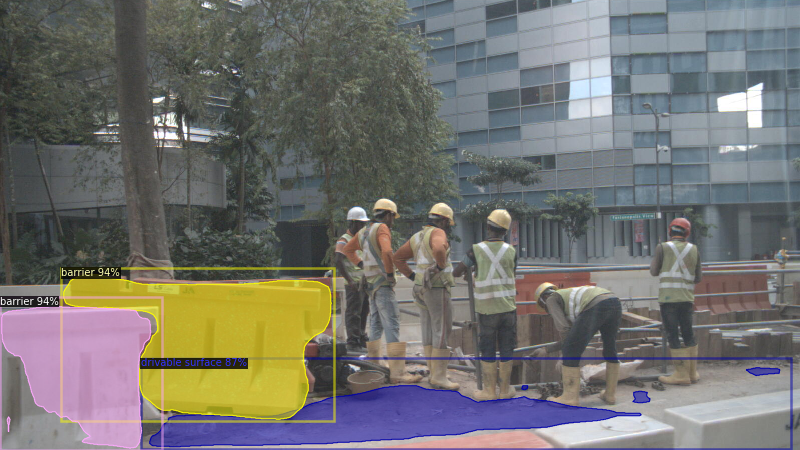

In [ ]:
get_predicted_img(val_img,'n013-2018-08-16-16-15-38+0800__CAM_BACK_RIGHT__1534407789878054.jpg')

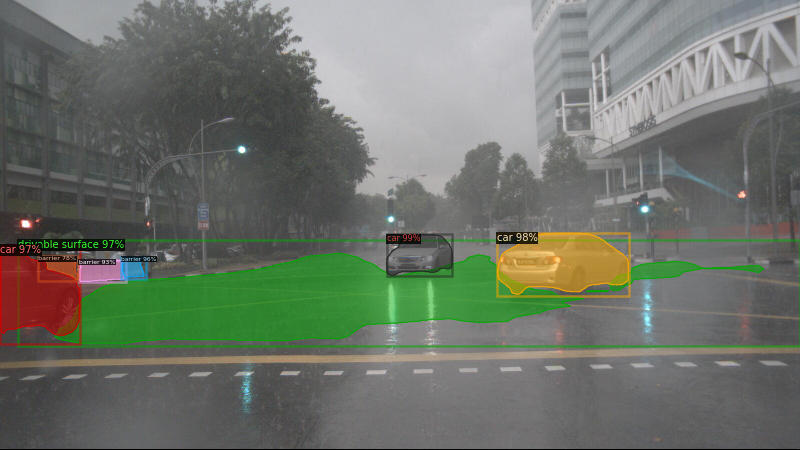

In [ ]:
get_predicted_img(val_img,'n004-2018-02-23-15-05-17+0800__CAM_FRONT__1519369991907473.jpg')

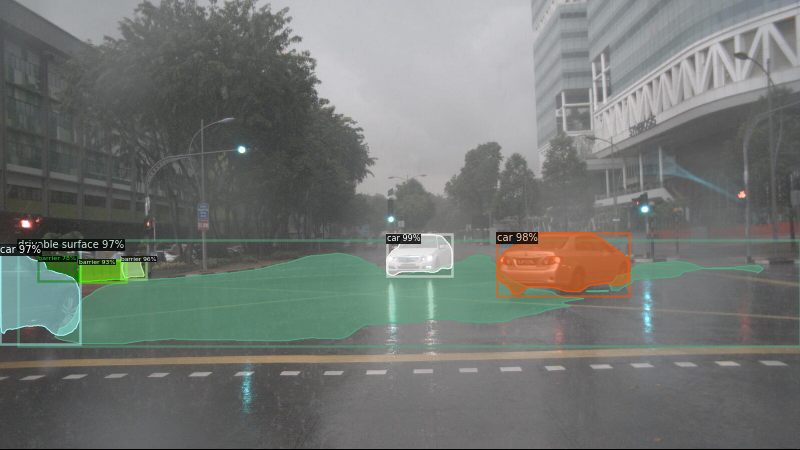

In [ ]:
get_predicted_img(val_img,'n004-2018-02-23-15-05-17+0800__CAM_FRONT__1519369991907473.jpg')

[0.98384166 0.9477508  0.92453295 0.9003994  0.8678005  0.8293148
 0.8169221  0.8064809  0.77200407]


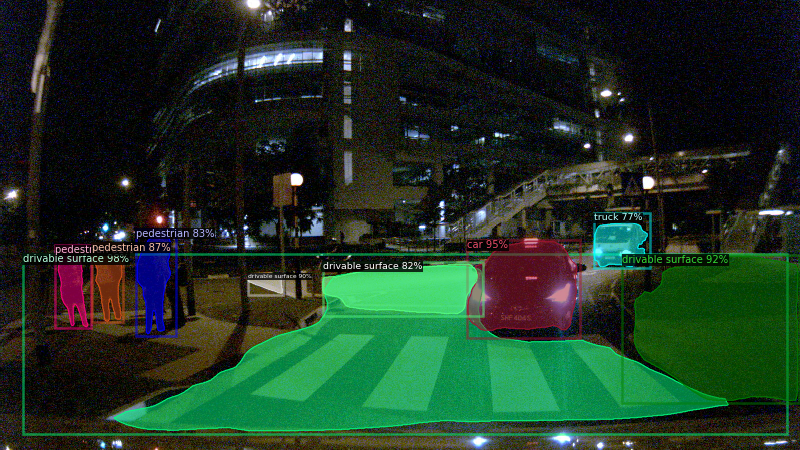

In [ ]:
get_predicted_img(val_img,'n015-2018-07-12-19-48-48+0800__CAM_BACK__1531396587687525.jpg')

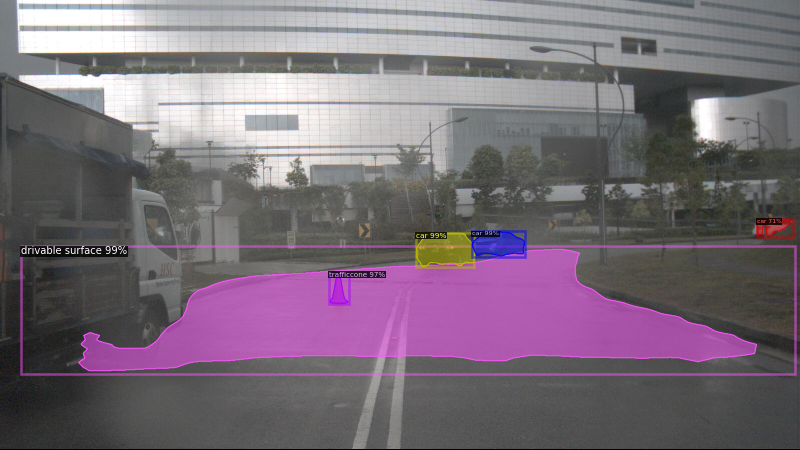

In [ ]:
get_predicted_img(train_img,'n004-2018-02-23-15-05-17+0800__CAM_FRONT__1519369827068367.jpg')

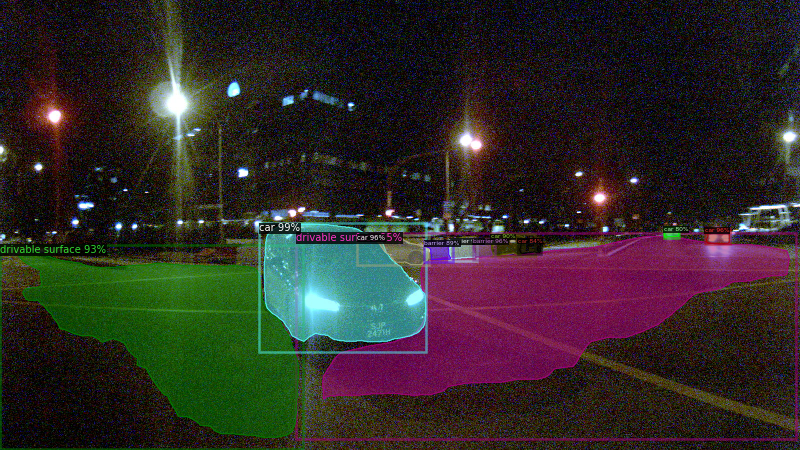

In [ ]:
get_predicted_img(train_img,'n005-2018-06-14-20-11-03+0800__CAM_BACK__1528980200037591.jpg')

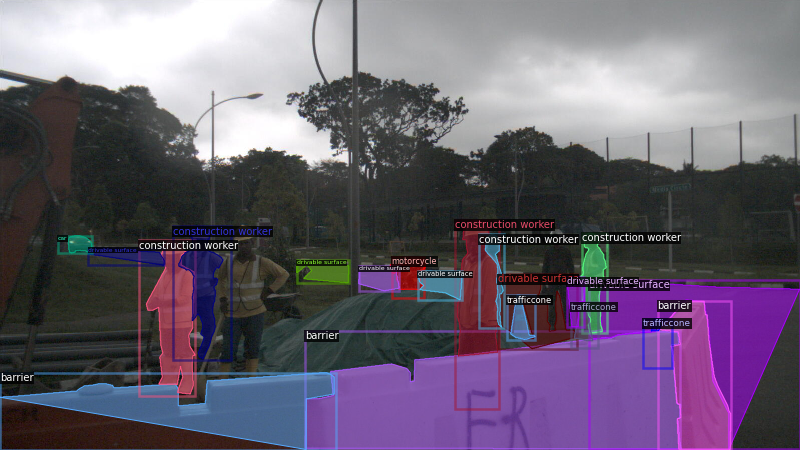

In [ ]:
get_label_img(train_img,'n013-2018-07-30-11-58-27+0800__CAM_FRONT_LEFT__1532923529104825.jpg')

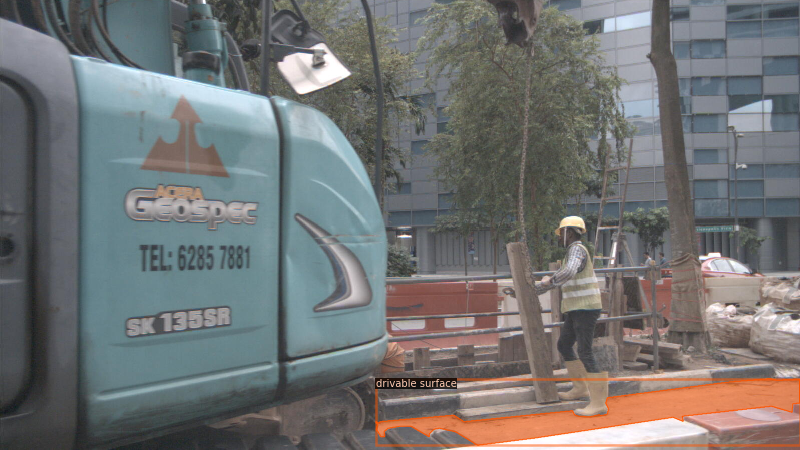

In [ ]:
get_label_img(train_img,'n013-2018-07-31-13-56-46+0800__CAM_BACK_RIGHT__1533016744428054.jpg')